In [1]:
import json
import numpy as np
import glob
import os
import anndata

import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import pandas as pd
import json

from sklearn.metrics import pairwise_distances

import importlib

from dredFISH.Utils.__init__plots import *
from dredFISH.Utils import basicu 
from dredFISH.Utils.miscu import order_by_hc
from dredFISH.Utils import designu

# from dredFISH.Design.model_v2p2_gene_constraints import CellTypeNet
from dredFISH.Design import data_loader_scrna 

config = importlib.import_module("dredfish_processing_config")

importlib.reload(data_loader_scrna)
importlib.reload(designu)

<module 'dredFISH.Utils.designu' from '/bigstore/GeneralStorage/fangming/projects/dredfish/packages/dredFISH/dredFISH/Utils/designu.py'>

In [2]:
def normalize_w_v2(W, cnstrnts, num_tp=90000):
    """Normalize the matrix W from DPNMF
    - scale 
    - integerize
    - cap probe constraints
    - remove genes with no weights
    
    arguments:
    - W: DataFrame
    """
    assert len(W) == len(cnstrnts)
    
    # scale
    Wn = W/(W.sum().sum())*num_tp
    # integerize 
    Wn = (Wn+0.5).astype(int)
    # # constraints
    # for col in Wn:
    #     Wn[col] = np.clip(Wn[col], None, cnstrnts)
        
    # constraints (total counts of a gene across 24 basis has limit)
    cnstrnts_scale = np.clip(Wn.sum(axis=1)/cnstrnts, 1, None).values # at least 1; maybe >1 
    Wn_g = Wn/cnstrnts_scale.reshape(-1,1)
    Wn_g = Wn_g.fillna(0).astype(int) # NaN means cnstrnts == 0
        
    # remove genes with no weights
    nonzero_cond = Wn.sum(axis=1)>0      
    Wn_slim = Wn.loc[nonzero_cond]
    
    # remove genes with no weights
    nonzero_cond_g = Wn_g.sum(axis=1)>0      
    Wn_slim_g = Wn_g.loc[nonzero_cond_g]
    
    print(f"Total num probes: {Wn.sum().sum():,}")
    print(f"Total num genes: {nonzero_cond.sum():,}")
    
    print(f"Total num probes: {Wn_g.sum().sum():,}")
    print(f"Total num genes: {nonzero_cond_g.sum():,}")

    return Wn, Wn_g, Wn_slim, Wn_slim_g, nonzero_cond, nonzero_cond_g

In [3]:
def proc_pmat(pmat, ftrs_all, genes_idx, clsts, _drows=None):
    """
    """
    prx = torch.from_numpy(pmat.values).float()
    
    ftrs = basicu.libsize_norm(ftrs_all, scale=1e6)
    ftrs = ftrs[:,genes_idx] 
    prjx = ftrs.mm(prx)
    # if option == 'dpnmf':
    embx = prjx #/torch.reshape(prjx.sum(1), (-1,1)) #+1
    # else:
    #     embx = np.log10(prjx+1)
        
    # elif option == 'igor':
    #     embx, _reg = nrmNN.forward(prjx)

    prjx = prjx.numpy()
    embx = embx.numpy()
    print(prjx.shape, embx.shape, clsts.shape)

    nzero_prbe_cond = pmat.sum(axis=1) > 0
    pospmat = pmat[nzero_prbe_cond]
    fpmat = pospmat.divide(pospmat.sum(axis=0), axis=1)
    print(pospmat.shape, fpmat.shape)

    prjx_clsts, _ = basicu.group_mean(prjx, clsts)
    embx_clsts, _ = basicu.group_mean(embx, clsts)
    embx_clsts_z  = basicu.zscore(embx_clsts, allow_nan=True, axis=0)
    embx_clsts_corr = np.corrcoef(embx_clsts_z)

    # order by HC
    _rows = order_by_hc(embx_clsts)
    _cols = order_by_hc(embx_clsts.T)
    
    # order to emphasize diagonal elements (columns) (take quite long)
    _, _, _dcols = basicu.diag_matrix_cols(embx_clsts_z[_drows,:]) # this takes quite long
    
    return fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols

In [4]:
device = torch.device('cpu')
torch.manual_seed(0) # reproduciability

In [5]:
for i, bit in enumerate(config.bitmap):
    print(i, bit)

0 ('RS0109_cy5', 'hybe2', 'FarRed')
1 ('RS0175_cy5', 'hybe3', 'FarRed')
2 ('RS0237_cy5', 'hybe4', 'FarRed')
3 ('RS0307_cy5', 'hybe5', 'FarRed')
4 ('RS0332_cy5', 'hybe6', 'FarRed')
5 ('RS0384_atto565', 'hybe10', 'FarRed')
6 ('RS0406_atto565', 'hybe11', 'FarRed')
7 ('RS0451_atto565', 'hybe12', 'FarRed')
8 ('RS0468_atto565', 'hybe13', 'FarRed')
9 ('RS0548_atto565', 'hybe14', 'FarRed')
10 ('RS64.0_atto565', 'hybe15', 'FarRed')
11 ('RS156.0_alexa488', 'hybe19', 'FarRed')
12 ('RS278.0_alexa488', 'hybe20', 'FarRed')
13 ('RS313.0_alexa488', 'hybe21', 'FarRed')
14 ('RS643.0_alexa488', 'hybe22', 'FarRed')
15 ('RS740.0_alexa488', 'hybe23', 'FarRed')
16 ('RS810.0_alexa488', 'hybe24', 'FarRed')
17 ('RSN9927.0_cy5', 'hybe7', 'FarRed')
18 ('RSN2336.0_cy5', 'hybe8', 'FarRed')
19 ('RSN1807.0_cy5', 'hybe9', 'FarRed')
20 ('RSN4287.0_atto565', 'hybe16', 'FarRed')
21 ('RSN1252.0_atto565', 'hybe17', 'FarRed')
22 ('RSN9535.0_atto565', 'hybe18', 'FarRed')
23 ('RS0095_cy5', 'hybe1', 'FarRed')
24 ('PolyT', 'hyb

In [6]:
pmat_cols = [bit[0].split('_')[0] for bit in config.bitmap[:24]]
pmat_cols

['RS0109',
 'RS0175',
 'RS0237',
 'RS0307',
 'RS0332',
 'RS0384',
 'RS0406',
 'RS0451',
 'RS0468',
 'RS0548',
 'RS64.0',
 'RS156.0',
 'RS278.0',
 'RS313.0',
 'RS643.0',
 'RS740.0',
 'RS810.0',
 'RSN9927.0',
 'RSN2336.0',
 'RSN1807.0',
 'RSN4287.0',
 'RSN1252.0',
 'RSN9535.0',
 'RS0095']

In [7]:
# the dataset
trn_dataloader = data_loader_scrna.load_Allen_data(
    datasetkey='smrt_trn', 
    keyX='counts', keyY='l3_code', keyYcat='l3_cat', 
    batch_size=64,
)
tst_dataloader = data_loader_scrna.load_Allen_data(
    datasetkey='smrt_tst', 
    keyX='counts', keyY='l3_code', keyYcat='l3_cat', 
    batch_size=5000,
)
f = os.path.join('/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna', 
                                    'gidx_cnstrnts_pshop_mm10_isoflat_l30_tm37-47_tp37_filtered_Oct28_2022.pt')
cnstrnts_idx = torch.load(f)
f = os.path.join('/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna',      
                                         'cnstrnts_pshop_mm10_isoflat_l30_tm37-47_tp37_filtered_Oct28_2022.pt')
cnstrnts = torch.load(f)

n_gns = len(cnstrnts) # trn_dataloader.dataset.X.shape[1] # number of genes
n_cat = len(trn_dataloader.dataset.Ycat) # number of clusters
genes_data = tst_dataloader.dataset.data['genes'][:] #.Genes
genes_cnst = genes_data[cnstrnts_idx]
print(genes_data.shape, genes_cnst.shape)

(45768,) (22324,)


In [8]:
%%time
# validation dataset
ftrs_all, clsts = next(iter(tst_dataloader))
ftrs_all = ftrs_all.float()#.numpy() # all features
clsts = clsts.long().numpy()

CPU times: user 2min 8s, sys: 22.7 s, total: 2min 31s
Wall time: 23.1 s


In [9]:
# cluster annotation
clst_annots = tst_dataloader.dataset.Ycat[:]
type_orders = clst_annots[np.unique(clsts)]

# analysis metadata
meta_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/analysis_meta_Mar31.json'
with open(meta_path, 'r') as fh:
    meta = json.load(fh)
l3clst_order = np.array(meta['l3_clsts']) # get cluster order

_rows_l3clsts = basicu.get_index_from_array(type_orders, l3clst_order)

l3clst_order.shape, type_orders.shape, _rows_l3clsts

((42,),
 (42,),
 array([34, 38, 39, 41, 37, 28, 29, 11, 17, 18, 24,  6, 10,  9, 12, 13, 14,
        15, 21, 25, 23,  5, 26, 27, 22, 31, 32, 16, 19, 20, 36,  1,  2,  3,
         7,  4,  0,  8, 30, 35, 40, 33]))

In [10]:
# get the NN genes and constraints (for DPNMF design)
f = '/bigstore/binfo/mouse/Brain/DRedFISH/Allen_V3_Reference/10X/genes.npy' 
nngenes = np.load(f)
f = '/bigstore/binfo/mouse/Brain/DRedFISH/Allen_V3_Reference/10X/probe_constraints.npy'
nngene_cnstrnts = np.load(f)
assert len(nngene_cnstrnts) == len(nngenes)
print(nngene_cnstrnts.shape)

(10861,)


In [11]:
# get new set genes and constraints
# f = '/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna/pshop_smart_l5n100_cpm1_genes.txt' 
f = '/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna/pshop_smart_full_cpm1_genes_13k_oct13_2022.txt' 
newgenes = np.loadtxt(f, dtype=str)
newgene_cnstrnts = cnstrnts[basicu.get_index_from_array(genes_cnst, newgenes)].numpy()
newgenes.shape, newgene_cnstrnts.shape

((13489,), (13489,))

In [12]:
all_ws = {}

all_pmats = {}
all_pmats_g = {}

all_genes = {}
all_genes_g = {}

all_gidxs = {}
all_gidxs_g = {}

# nrmNN = InstNrm()

In [13]:
# DPNMF probe set
f = "/bigstore/GeneralStorage/fangming/projects/dredfish/data/dpnmf.csv"
pmat = pd.read_csv(f, index_col=0) # [pmat_cols]
pmat = pmat[pmat.sum(axis=1)>0]
pmat.columns = [col.split("_")[0] for col in pmat.columns]
assert np.all(pmat_cols == pmat.columns.values)
genes = pmat.index.values
print(pmat.shape, genes.shape)

# select only those existed in data
genes_comm = np.intersect1d(genes, genes_data)
genes = genes_comm
genes_idx = basicu.get_index_from_array(genes_data, genes)
pmat = pmat.loc[genes_comm]
print(pmat.shape, genes.shape, genes_idx.shape)

meth = 'DPNMF orig'
all_ws[meth] = ''
all_pmats[meth] = pmat
all_genes[meth] = genes
all_gidxs[meth] = genes_idx

all_pmats_g[meth] = pmat
all_genes_g[meth] = genes
all_gidxs_g[meth] = genes_idx

# extra thing
genes_orig_dpnmf_positive = genes

(5818, 24) (5818,)
(5576, 24) (5576,) (5576,)


In [14]:
# new DPNMF designs
fs = [
    f'/bigstore/GeneralStorage/fangming/projects/dredfish/res_dpnmf/v_python/smrt_X_DPNMF_tree_oct13set_v1.h5ad', 
]

for f in fs:
    adata = anndata.read(f)
    # mus = [float(key[len('w_mu'):]) for key in adata.layers.keys()]
    mus = [0, 2e3, 5e3,]
    for mu in mus:
        label = f'w_mu{mu:.1e}'
        meth = f'DPNMF tree v1 {mu:.1e}'
        print(meth)

        W = adata.layers[label]
        W = pd.DataFrame(W)

        pmat, pmat_g, _, _, _, _ = normalize_w_v2(W, newgene_cnstrnts, num_tp=90000)
        pmat.index = newgenes
        pmat.columns = pmat_cols
        pmat_g.index = newgenes
        pmat_g.columns = pmat_cols

        pmat = pmat[pmat.sum(axis=1)>0]
        assert np.all(pmat_cols == pmat.columns.values)
        genes = pmat.index.values
        # print(pmat.shape, genes.shape)
        
        pmat_g = pmat_g[pmat_g.sum(axis=1)>0]
        assert np.all(pmat_cols == pmat.columns.values)
        genes_g = pmat_g.index.values

        # select only those existed in data
        genes_comm = np.intersect1d(genes, genes_data)
        genes = genes_comm
        genes_idx = basicu.get_index_from_array(genes_data, genes)
        pmat = pmat.loc[genes_comm]
        
        # select only those existed in data
        genes_comm_g = np.intersect1d(genes_g, genes_data)
        genes_g = genes_comm_g
        genes_idx_g = basicu.get_index_from_array(genes_data, genes_g)
        pmat_g = pmat_g.loc[genes_comm_g]

        # meth = 'DPNMF pca'
        all_ws[meth] = W
        
        all_pmats[meth] = pmat
        all_pmats_g[meth] = pmat_g
        
        all_genes[meth] = genes
        all_genes_g[meth] = genes_g
        
        all_gidxs[meth] = genes_idx
        all_gidxs_g[meth] = genes_idx_g

DPNMF tree v1 0.0e+00
Total num probes: 86,138
Total num genes: 10,465
Total num probes: 62,845
Total num genes: 10,360
DPNMF tree v1 2.0e+03
Total num probes: 89,369
Total num genes: 7,567
Total num probes: 50,534
Total num genes: 7,561
DPNMF tree v1 5.0e+03
Total num probes: 89,701
Total num genes: 4,391
Total num probes: 36,672
Total num genes: 4,389


In [15]:
# new DPNMF designs
fs = [
    f'/bigstore/GeneralStorage/fangming/projects/dredfish/res_dpnmf/v_python/smrt_X_DPNMF_tree_oct13set_v2.h5ad', 
]

for f in fs:
    adata = anndata.read(f)
    # mus = [float(key[len('w_mu'):]) for key in adata.layers.keys()]
    mus = [2e4]
    for mu in mus:
        label = f'w_mu{mu:.1e}'
        meth = f'DPNMF tree v2 {mu:.1e}'
        print(meth)

        W = adata.layers[label]
        W = pd.DataFrame(W)

        pmat, pmat_g, _, _, _, _ = normalize_w_v2(W, newgene_cnstrnts, num_tp=90000)
        pmat.index = newgenes
        pmat.columns = pmat_cols
        pmat_g.index = newgenes
        pmat_g.columns = pmat_cols

        pmat = pmat[pmat.sum(axis=1)>0]
        assert np.all(pmat_cols == pmat.columns.values)
        genes = pmat.index.values
        # print(pmat.shape, genes.shape)
        
        pmat_g = pmat_g[pmat_g.sum(axis=1)>0]
        assert np.all(pmat_cols == pmat.columns.values)
        genes_g = pmat_g.index.values

        # select only those existed in data
        genes_comm = np.intersect1d(genes, genes_data)
        genes = genes_comm
        genes_idx = basicu.get_index_from_array(genes_data, genes)
        pmat = pmat.loc[genes_comm]
        
        # select only those existed in data
        genes_comm_g = np.intersect1d(genes_g, genes_data)
        genes_g = genes_comm_g
        genes_idx_g = basicu.get_index_from_array(genes_data, genes_g)
        pmat_g = pmat_g.loc[genes_comm_g]

        # meth = 'DPNMF pca'
        all_ws[meth] = W
        all_pmats[meth] = pmat
        all_pmats_g[meth] = pmat_g
        
        all_genes[meth] = genes
        all_genes_g[meth] = genes_g
        
        all_gidxs[meth] = genes_idx
        all_gidxs_g[meth] = genes_idx_g

DPNMF tree v2 2.0e+04
Total num probes: 88,735
Total num genes: 9,860
Total num probes: 59,555
Total num genes: 9,844


# Compare

In [16]:
def plot_intn_v2(prjx, meth, color, ax1, ax2, ylim=None):
    """
    # intensity across bits
    """
    prjx_medbits = np.median(prjx, axis=0)
    prjx_q10bits = np.percentile(prjx, 10, axis=0)
    prjx_q90bits = np.percentile(prjx, 90, axis=0)
    # prjx_q01bits = np.percentile(prjx, 1 , axis=0)
    # prjx_q99bits = np.percentile(prjx, 99, axis=0)
    order = np.argsort(prjx_medbits)[::-1]
    
    n = len(prjx_medbits)
    
    ax = ax1
    ax.plot(np.arange(n), prjx_medbits[order], '-', label=meth, color=color)
    ax.fill_between(np.arange(n), 
                    y1=prjx_q10bits[order], 
                    y2=prjx_q90bits[order], 
                    edgecolor='none',
                    alpha=0.5,
                    color=color,
                   )

    ax.set_title('10,50,90 percentiles')
    ax.set_yscale('log')
    if ylim is not None:
        ax.set_ylim(ylim)
    ax.set_ylabel('Intensity')
    sns.despine(ax=ax)

    ax = ax2
    # ax.plot(np.arange(n), np.log2((prjx_q90bits[order]+1)/(prjx_q10bits[order]+1)), '-', label=meth, color=color)
    ax.plot(np.arange(n), (prjx_q90bits[order]+1)/(prjx_q10bits[order]+1), '-', label=meth, color=color)
    # ax.set_ylim(ymin=0)
    ax.set_yscale('log')
    ax.set_ylabel('FC 90%/10%')
    ax.legend(bbox_to_anchor=(1,1))
    sns.despine(ax=ax)
    ax.set_ylim(ymax=100)
    # ax.set_xticks(np.arange(n)) 
    # ax.set_xticklabels(order, rotation=90)
    return

In [17]:
palette = sns.color_palette('tab10', len(all_pmats.keys()))
palette

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353)]

In [18]:
methods = list(all_pmats.keys())
colors = palette[:len(methods)]

In [19]:
all_res = {}
all_res_g = {}

for meth in methods:
    pmat = all_pmats[meth]
    genes_idx = all_gidxs[meth]
    
    pmat_g = all_pmats_g[meth]
    genes_idx_g = all_gidxs_g[meth]
    
    # unclipped
    (fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, 
     _rows, _cols, _dcols) = proc_pmat(pmat, ftrs_all, genes_idx, clsts, 
                               _drows=_rows_l3clsts)
    all_res[meth] = fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols
    
    # clipped
    (fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, 
     _rows, _cols, _dcols) = proc_pmat(pmat_g, ftrs_all, genes_idx_g, clsts, 
                               _drows=_rows_l3clsts)
    all_res_g[meth] = fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols

(5000, 24) (5000, 24) (5000,)
(5576, 24) (5576, 24)
(5000, 24) (5000, 24) (5000,)
(5576, 24) (5576, 24)
(5000, 24) (5000, 24) (5000,)
(10465, 24) (10465, 24)
(5000, 24) (5000, 24) (5000,)
(10360, 24) (10360, 24)
(5000, 24) (5000, 24) (5000,)
(7567, 24) (7567, 24)
(5000, 24) (5000, 24) (5000,)
(7561, 24) (7561, 24)
(5000, 24) (5000, 24) (5000,)
(4391, 24) (4391, 24)
(5000, 24) (5000, 24) (5000,)
(4389, 24) (4389, 24)
(5000, 24) (5000, 24) (5000,)
(9860, 24) (9860, 24)
(5000, 24) (5000, 24) (5000,)
(9844, 24) (9844, 24)


(10465, 24) (10465,)
(10465,) (10465,)
(7567, 24) (7567,)
(7567,) (7567,)
(4391, 24) (4391,)
(4391,) (4391,)
(9860, 24) (9860,)
(9860,) (9860,)


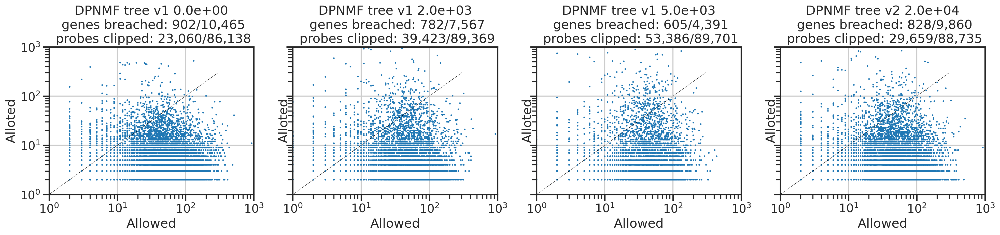

In [20]:
n = len(methods)-1
nx = 4
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(nx*5,ny*5), sharex=True, sharey=True)
i = 0
for lbl in methods:
    if lbl.startswith('DPNMF tree'):
        ax = axs.flat[i]
        i += 1
        
        w = all_ws[lbl]
        genes = newgenes
        w = w.values
        wi = (w*90000/np.sum(w)+0.5).astype(int)
        cond = wi.sum(axis=1)>0
        wi = wi[cond]
        genes = genes[cond]
        print(wi.shape, genes.shape)
        
        alloted = wi.sum(axis=1)
        # get the gene idx in data that need to get their constraints
        gene_idx_query = basicu.get_index_from_array(genes_data, genes)
        # their idx in the vector `cnstrnts` 
        cnstrnts_idx_query = basicu.get_index_from_array(cnstrnts_idx, gene_idx_query) 
        # get the allowed 
        allowed = np.hstack([cnstrnts.numpy(),0])[cnstrnts_idx_query] # trick to account for -1
        print(alloted.shape, allowed.shape)
        
        ax.scatter(allowed, alloted, s=5, label=lbl, edgecolor='none')
        nb = (alloted>allowed).sum()
        npb = np.clip(alloted-allowed, 0, None).sum()

        ax.set_title(f'{lbl}\n genes breached: {nb}/{len(genes):,}\n probes clipped: {npb:,}/{np.sum(wi):,}')
        ax.plot([0,300], [0,300], '--k', linewidth=0.5)
        ax.set_xlim([1, 1000])
        ax.set_ylim([1, 1000])
        ax.set_xlabel('Allowed')
        ax.set_ylabel('Alloted')
        ax.set_xscale('log')
        ax.set_yscale('log')
fig.tight_layout()
plt.show()

In [21]:
def plot_enc_v2(pmat, fpmat, pmat_g, fpmat_g, title=""):
    """
    """
    pm = sns.color_palette('husl', n_colors=pmat.shape[1])
    
    with sns.axes_style('ticks'):
        fig = plt.figure(figsize=(15*2,6))
        ax_dict = fig.subplot_mosaic("AACBBBGDDFEEE")
        
        ax = ax_dict['A']
        _mat, _row, _col = basicu.diag_matrix_rows(fpmat.values)
        nmat = len(_mat)
        sns.heatmap(pd.DataFrame(_mat, columns=_col), 
                    xticklabels=5, 
                    cmap='rocket_r',
                    ax=ax, 
                    vmax=0.01, 
                    cbar_kws=dict(shrink=0.3, label='Weight prop.', ticks=[0,0.01], aspect=10,),
                   )
        ax.set_xlabel('Basis')
        ax.set_ylabel('Genes')
        ax.set_yticks([nmat])
        ax.set_title(f"Total #: {int(np.sum(pmat.values))}")
        ax.text(0, nmat, nmat, ha='right')
        
        ax = ax_dict['B']
        for i, col in enumerate(pmat):
            _x = pmat[col]
            _x = np.flip(np.sort(_x[_x>0])) #[:,:,-1]
            ax.plot(_x, color=pm[i], label=f'{i}')
        ax.set_yscale('log')
        ax.set_xlabel('Genes')
        ax.set_ylabel('Weight')
        sns.despine(ax=ax)
        ax.set_title('Encoding matrix')
        # ax.legend(ncol=3, title='Basis')
        
        ax_dict['C'].axis('off')
        ax_dict['F'].axis('off')
        ax_dict['G'].axis('off')
        
        ax = ax_dict['D']
        _mat, _row, _col = basicu.diag_matrix_rows(fpmat_g.values)
        nmat = len(_mat)
        sns.heatmap(pd.DataFrame(_mat, columns=_col), 
                    xticklabels=5, 
                    cmap='rocket_r',
                    ax=ax, 
                    vmax=0.01, 
                    cbar_kws=dict(shrink=0.3, label='Weight prop.', ticks=[0,0.01], aspect=10,),
                   )
        ax.set_xlabel('Basis')
        ax.set_ylabel('Genes')
        ax.set_yticks([nmat])
        ax.set_title(f"Total #: {int(np.sum(pmat_g.values))}")
        ax.text(0, nmat, nmat, ha='right')
        
        ax = ax_dict['E']
        for i, col in enumerate(pmat_g):
            _x = pmat_g[col]
            _x = np.flip(np.sort(_x[_x>0])) #[:,:,-1]
            ax.plot(_x, color=pm[i], label=f'{i}')
        ax.set_yscale('log')
        ax.set_xlabel('Genes')
        ax.set_ylabel('Weight')
        sns.despine(ax=ax)
        ax.set_title('Encoding matrix')
        # ax.legend(ncol=3, title='Basis')
        
        fig.suptitle(title)
        plt.show()
    return 

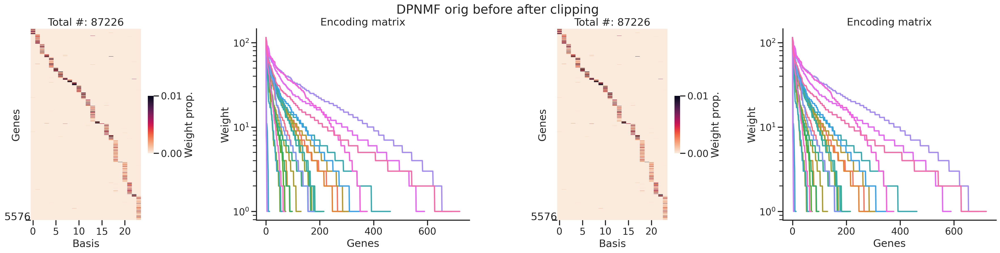

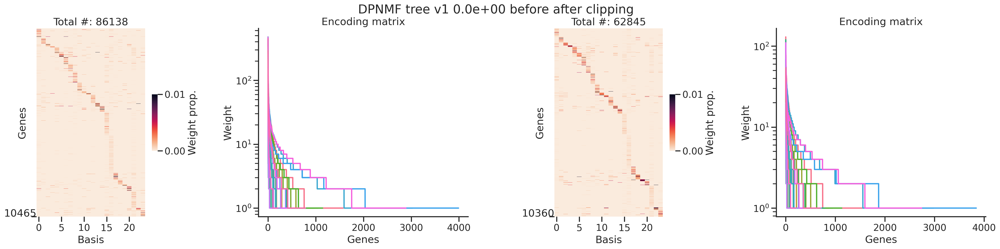

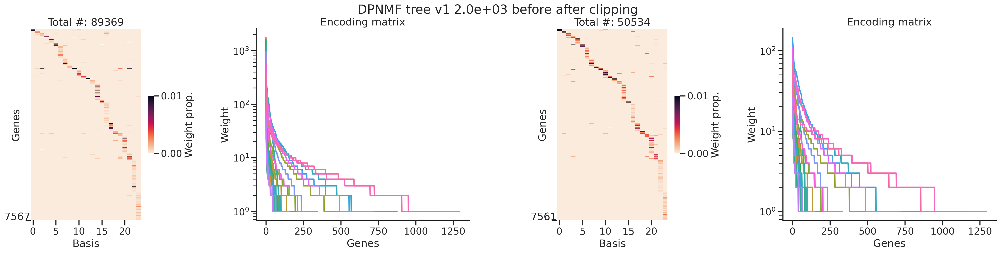

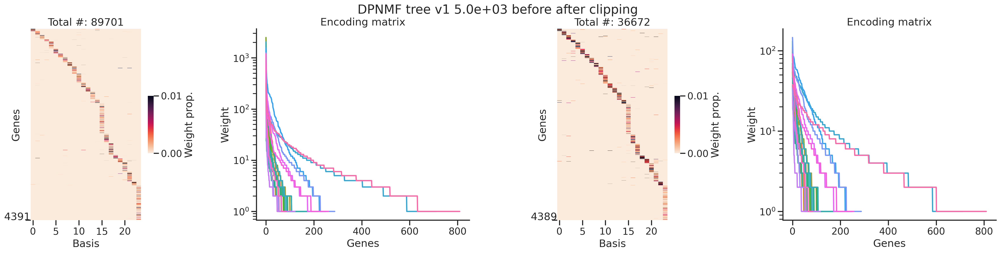

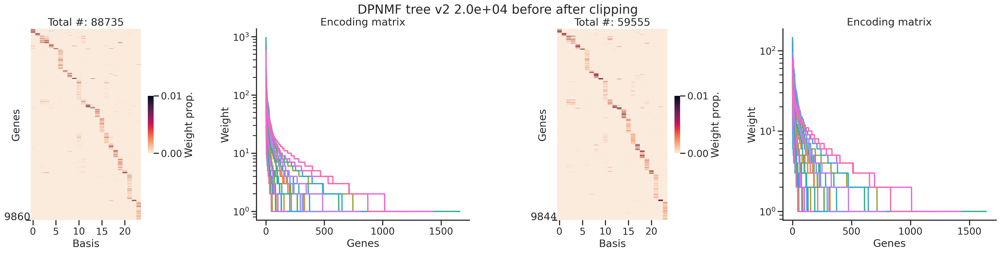

In [22]:
for meth in methods:
    pmat = all_pmats[meth]
    fpmat = all_res[meth][0]
    
    pmat_g = all_pmats_g[meth]
    fpmat_g = all_res_g[meth][0]
    
    plot_enc_v2(pmat, fpmat, pmat_g, fpmat_g, title=f"{meth} before after clipping")

DPNMF orig
DPNMF tree v1 0.0e+00
DPNMF tree v1 2.0e+03
DPNMF tree v1 5.0e+03
DPNMF tree v2 2.0e+04
DPNMF orig
DPNMF tree v1 0.0e+00
DPNMF tree v1 2.0e+03
DPNMF tree v1 5.0e+03
DPNMF tree v2 2.0e+04


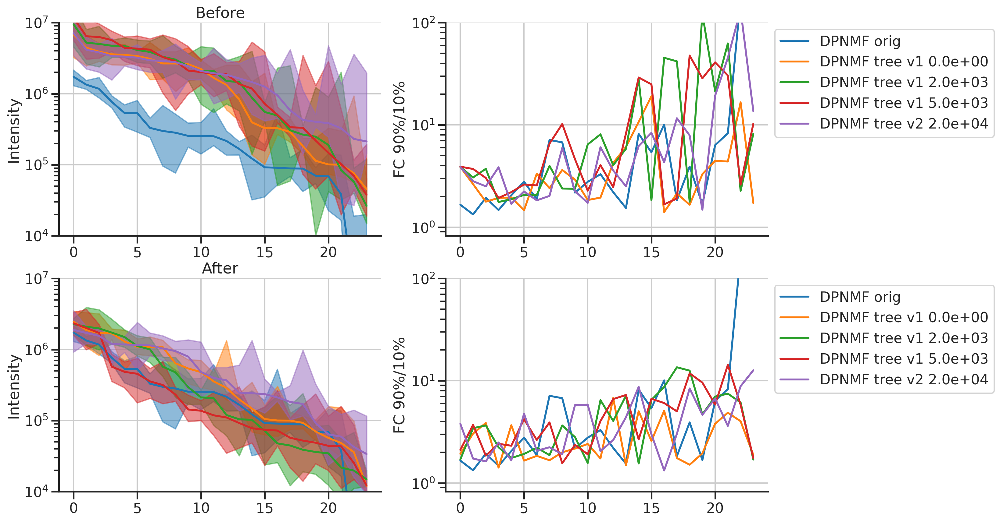

In [23]:
fig, axs = plt.subplots(2, 2, figsize=(15,10))
ax1, ax2 = axs[0]
for i, meth in enumerate(methods):
    print(meth)
    prjx = all_res[meth][1]
    color = colors[i] # f"C{i}"
    plot_intn_v2(prjx, meth, color, ax1, ax2, ylim=[1e4, 1e7])
ax1.set_title('Before')

ax1, ax2 = axs[1]
for i, meth in enumerate(methods):
    print(meth)
    prjx = all_res_g[meth][1]
    color = colors[i] # f"C{i}"
    plot_intn_v2(prjx, meth, color, ax1, ax2, ylim=[1e4, 1e7])
ax1.set_title('After')
fig.subplots_adjust(wspace=0.2)
plt.show()

In [24]:
def plot_embx_clsts_v2(
    prjx_clsts, embx_clsts, embx_clsts_z, 
    title1='log10(mean (Z))',
    title2='mean (Z_norm)',
    title3='bitwise zscored [mean (Z_norm)]',
    rownames=None, colnames=None, 
    _rows=None, _cols=None, 
    title='',
    figsize=(3*4,1*8)):
    """
    Projection matrix (Z)
    Embedded matrix (Z_norm)
    zscored
    
    rows, cols
    
    """
    m, n  = prjx_clsts.shape
    if rownames is None:
        rownames = np.arange(m)
    if colnames is None:
        colnames = np.arange(n)
    if _rows is None:
        _rows = np.arange(m)
    if _cols is None:
        _cols = np.arange(n)

    cbar_kws = dict(shrink=0.7, orientation='horizontal', fraction=0.02, pad=0.15)
    fig, axs = plt.subplots(1,3,figsize=figsize)
    ax = axs[0]
    _a = np.log10(prjx_clsts)
    
    sns.heatmap(_a[_rows][:,_cols], 
                yticklabels=rownames[_rows],
                xticklabels=colnames[_cols],
                cmap='coolwarm', 
                cbar_kws=cbar_kws,
                ax=ax,
               )
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)
    ax.set_title(title1)
    ax.set_xlabel('Basis')
    ax.set_ylabel('Cell types')

    ax = axs[1]
    sns.heatmap(np.log2(10)*(_a-_a.mean(axis=0))[_rows][:,_cols], 
                yticklabels=False,
                xticklabels=colnames[_cols],
                cmap='coolwarm', 
                cbar_kws=cbar_kws,
                ax=ax,
                center=0,
                vmax= np.log2(10), 
                vmin=-np.log2(10),
               )
    ax.set_title(title2)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)

    ax = axs[2]
    zmin = np.min(embx_clsts_z)
    zmax = np.max(embx_clsts_z)
    vmin = np.clip(zmin, -3, None) 
    vmax = np.clip(zmax, None, 3) 
    sns.heatmap(embx_clsts_z[_rows][:,_cols], 
                yticklabels=False,
                xticklabels=colnames[_cols],
                cmap='coolwarm', 
                cbar_kws=cbar_kws,
                vmin=vmin,
                vmax=vmax,
                ax=ax,
               )
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)
    ax.set_title(title3)
    fig.suptitle(title)
    fig.subplots_adjust(wspace=0.05)
    plt.show()

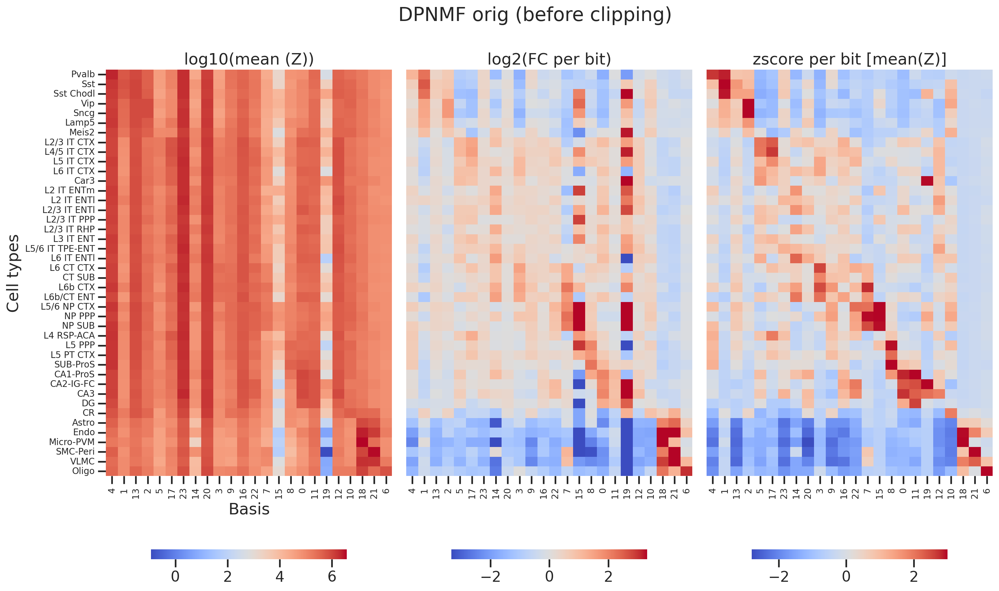

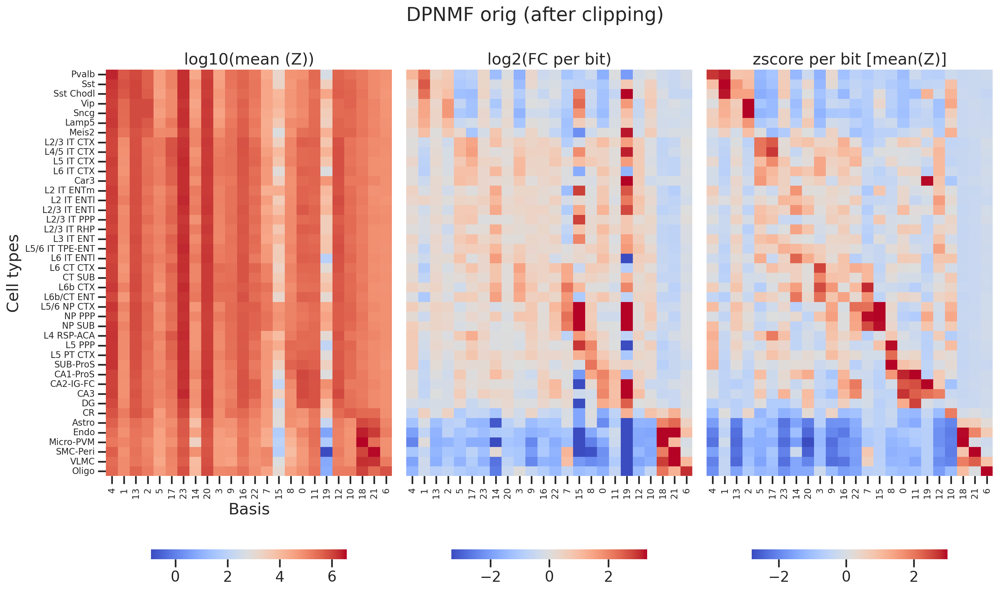

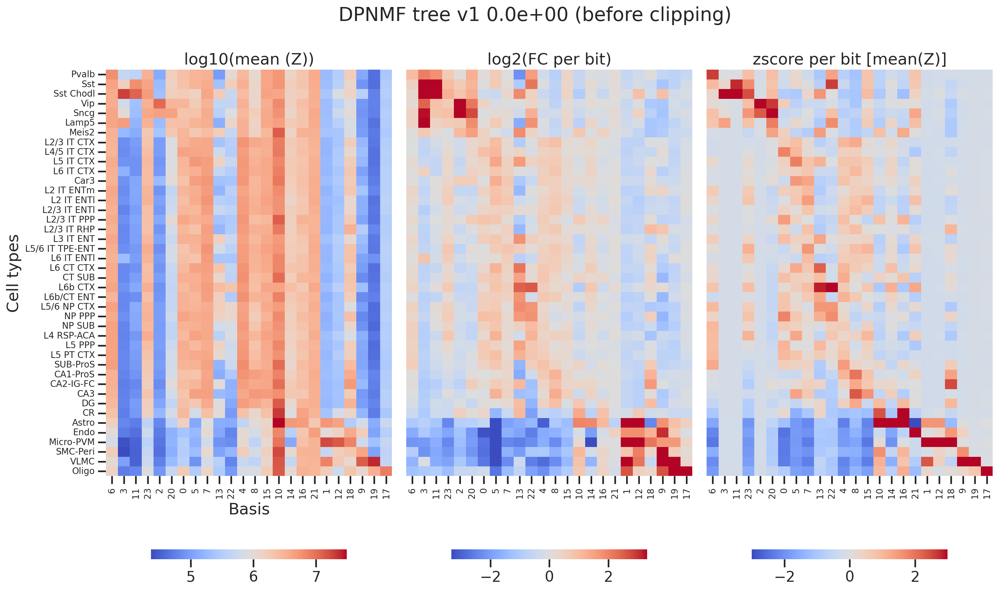

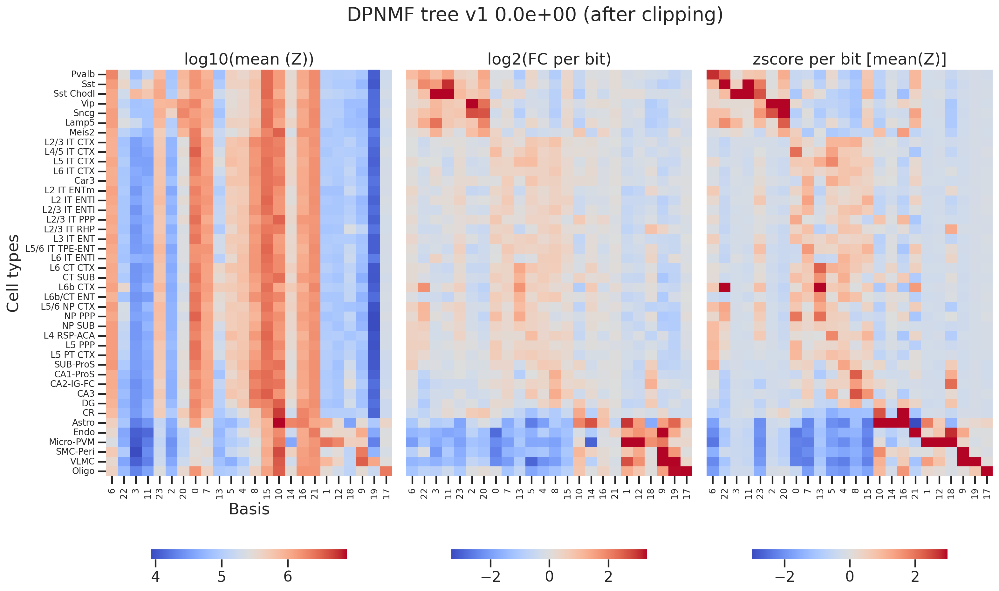

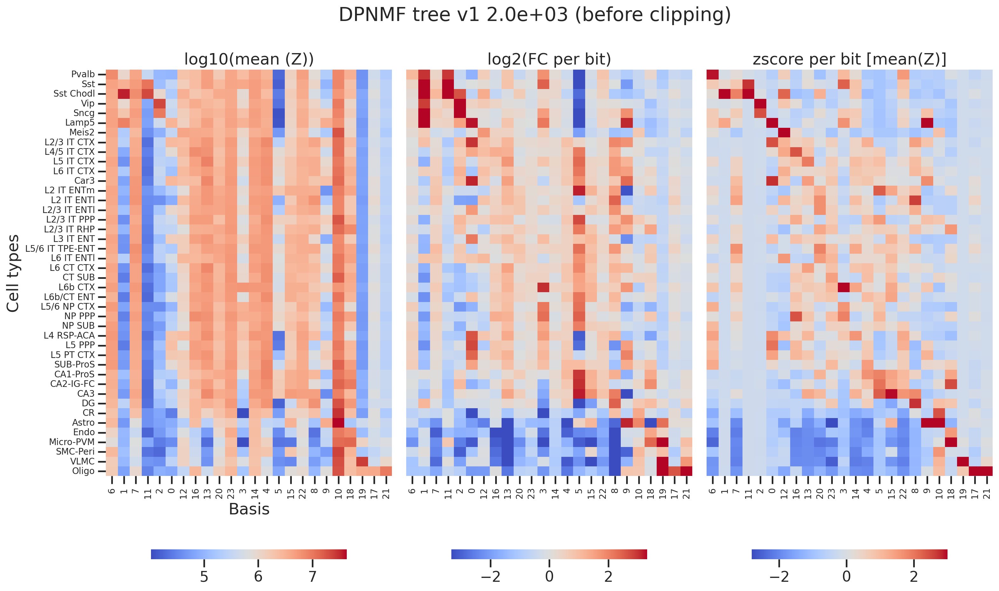

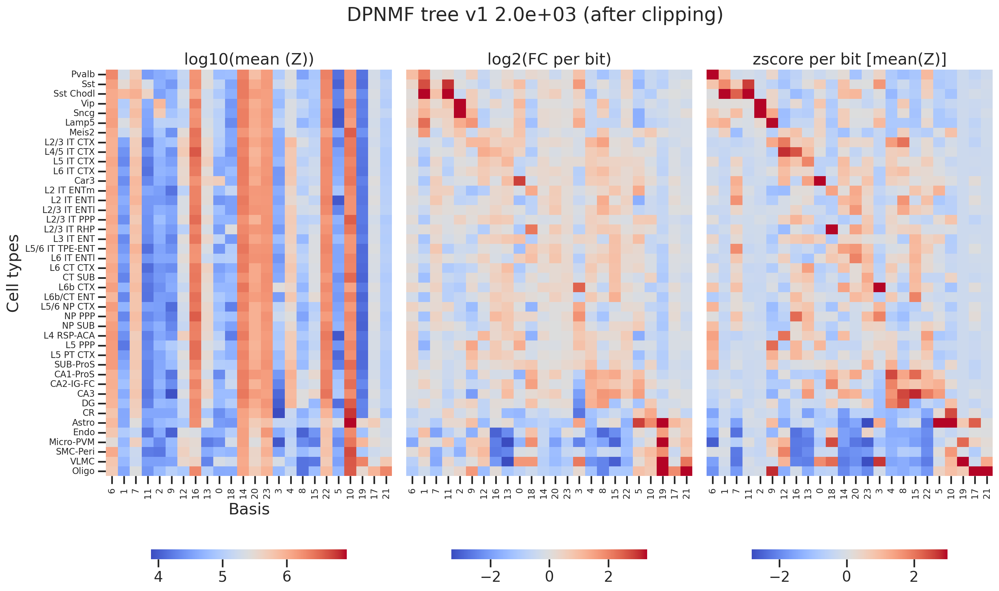

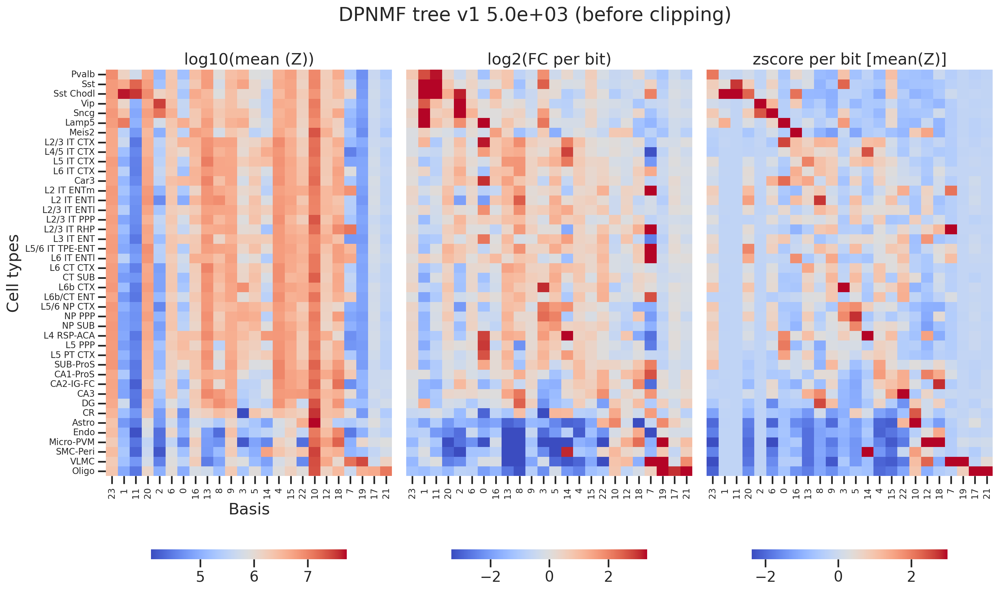

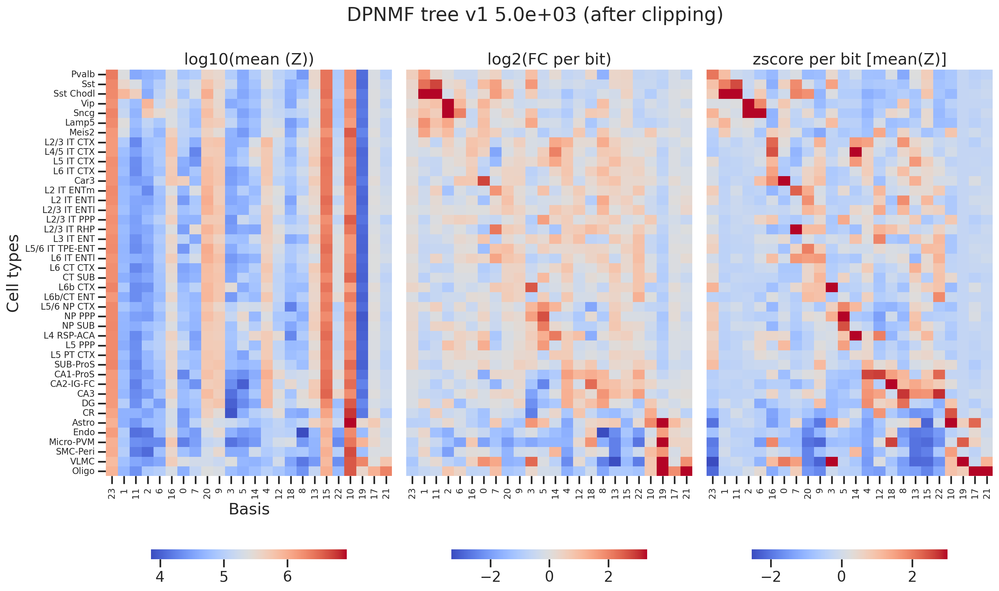

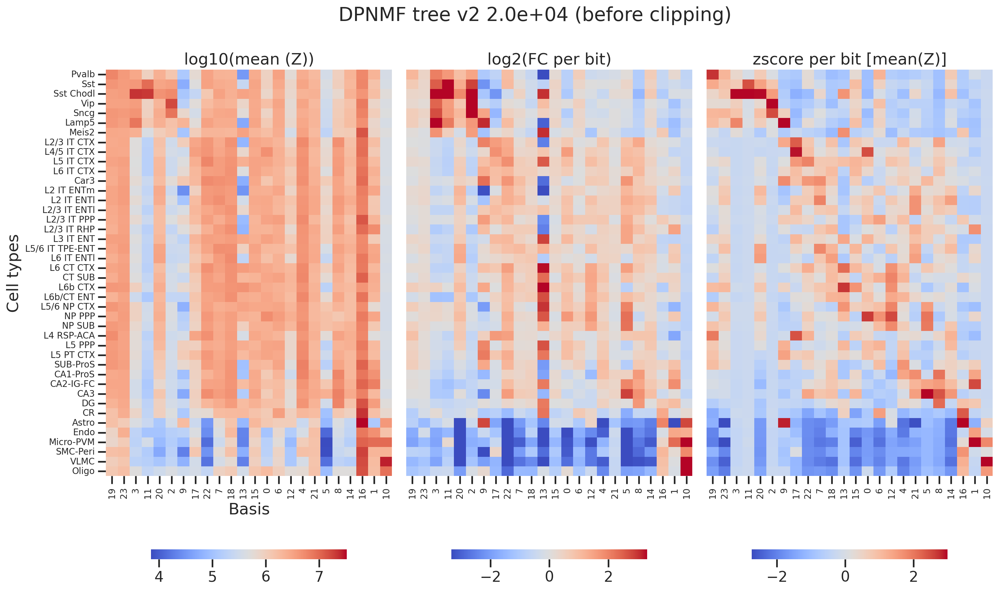

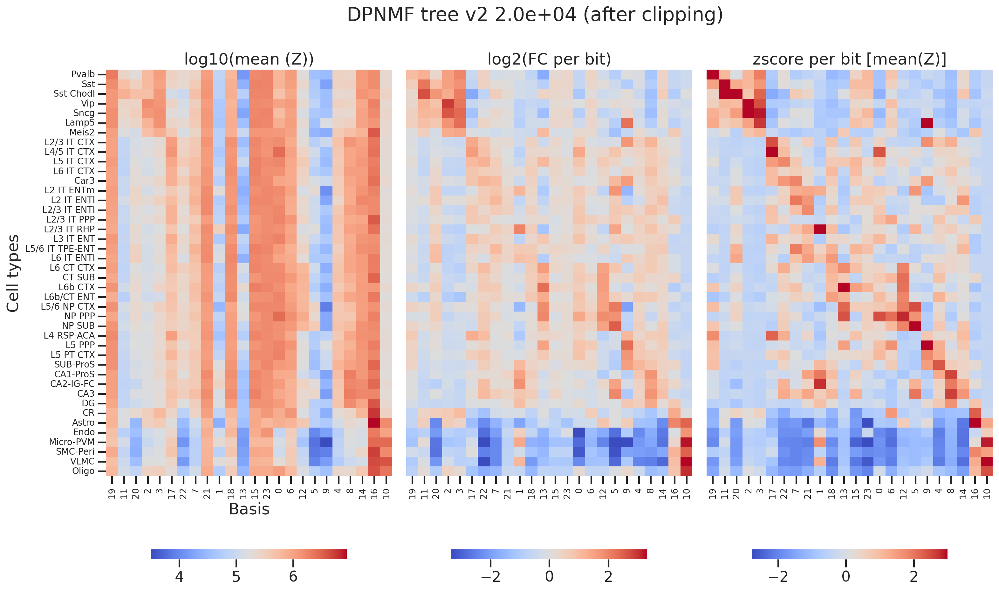

In [25]:
# diagnal ordering
for meth in methods:
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols, = all_res[meth] 
    plot_embx_clsts_v2(prjx_clsts, embx_clsts, embx_clsts_z, 
                            rownames=type_orders, # before rearange 
                            colnames=np.arange(24), # before rearange
                            _rows=_rows_l3clsts, # how to rearange
                            _cols=_dcols, #_dcols, #None, 
                            title=meth + " (before clipping)",
                            figsize=(3*6, 1*10),
                            title2='log2(FC per bit)',
                            title3='zscore per bit [mean(Z)]',
                           )
    
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols, = all_res_g[meth] 
    plot_embx_clsts_v2(prjx_clsts, embx_clsts, embx_clsts_z, 
                            rownames=type_orders, # before rearange 
                            colnames=np.arange(24), # before rearange
                            _rows=_rows_l3clsts, # how to rearange
                            _cols=_dcols, #_dcols, #None, 
                            title=meth + " (after clipping)",
                            figsize=(3*6, 1*10),
                            title2='log2(FC per bit)',
                            title3='zscore per bit [mean(Z)]',
                           )

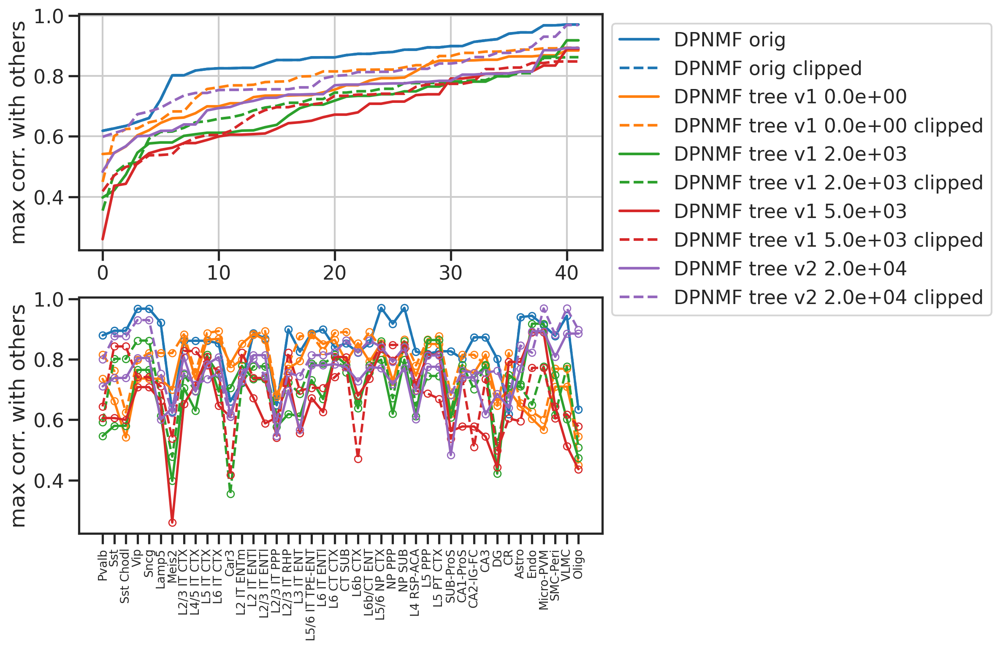

In [26]:
fig, axs = plt.subplots(2,1,figsize=(1*8,2*4))
for i, meth in enumerate(methods):
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res[meth] 
    corrmat = embx_clsts_corr[_rows_l3clsts,:][:,_rows_l3clsts]
    
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr_g, _rows, _cols, _dcols = all_res_g[meth] 
    corrmat_g = embx_clsts_corr_g[_rows_l3clsts,:][:,_rows_l3clsts]
    
    # corr mat
    ax = axs[0]
    ax.plot(np.sort(np.sort(corrmat, axis=0)[-2]),   '-',  label=meth, color=colors[i])
    ax.plot(np.sort(np.sort(corrmat_g, axis=0)[-2]), '--', label=meth+' clipped', color=colors[i])
    
    ax = axs[1]
    ax.plot(np.sort(corrmat, axis=0)[-2],   '-o',  label=meth, markersize=6, linewidth=2, fillstyle='none', color=colors[i])
    ax.plot(np.sort(corrmat_g, axis=0)[-2], '--o', label=meth+' clipped', markersize=6, linewidth=2, fillstyle='none', color=colors[i])
    
    ax.set_xticks(np.arange(len(corrmat)))
    ax.set_xticklabels(l3clst_order, rotation=90, fontsize=10)
    ax.grid(False)
    
axs[0].legend(bbox_to_anchor=(1,1))
axs[0].set_ylabel('max corr. with others')
axs[1].set_ylabel('max corr. with others')
plt.show()

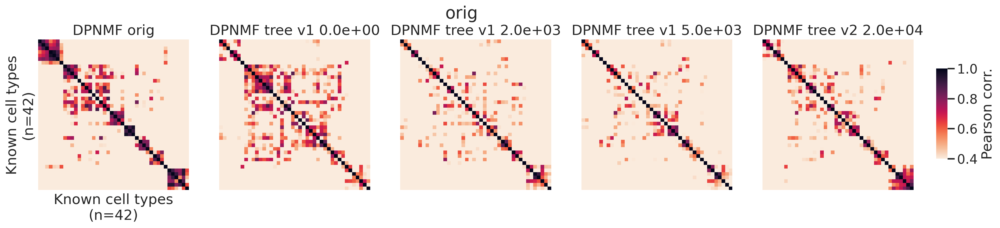

In [27]:
# DPNMF tree
n = len(methods)
nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(nx*4,ny*4))
cbar_ax = fig.add_axes([0.92, 0.3, 0.01, 0.4])
fig.suptitle('orig')
for i, meth in enumerate(methods):
    ax = axs.flat[i]
    if i == 0: 
        label = True
    else: 
        label = False
        
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res[meth] 
    designu.plot_heatcorr(
        # embx_clsts_corr, 
        embx_clsts_corr[_rows_l3clsts,:][:,_rows_l3clsts], 
        vmin=0.4, 
        title=meth, 
        ax=ax,
        cbar_ax=cbar_ax,
        label=label,
    )

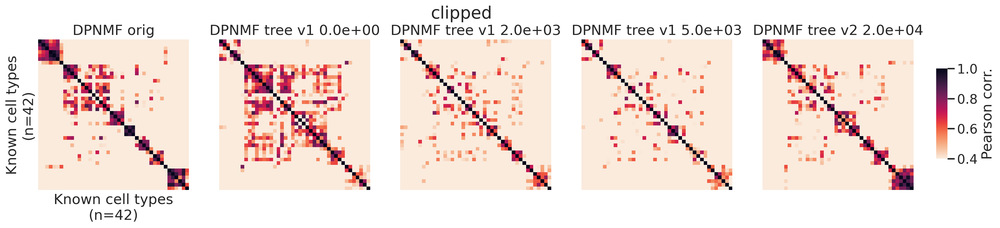

In [28]:
# DPNMF tree
n = len(methods)
nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(nx*4,ny*4))
cbar_ax = fig.add_axes([0.92, 0.3, 0.01, 0.4])
fig.suptitle('clipped')
for i, meth in enumerate(methods):
    ax = axs.flat[i]
    if i == 0: 
        label = True
    else: 
        label = False
        
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res_g[meth] 
    designu.plot_heatcorr(
        # embx_clsts_corr, 
        embx_clsts_corr[_rows_l3clsts,:][:,_rows_l3clsts], 
        vmin=0.4, 
        title=meth, 
        ax=ax,
        cbar_ax=cbar_ax,
        label=label,
    )

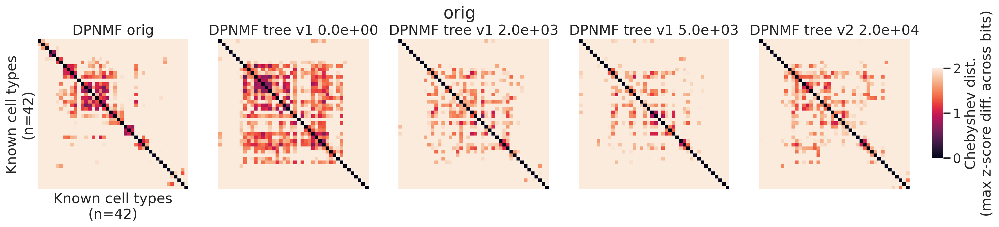

In [29]:
n = len(methods)
nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(nx*4,ny*4))
cbar_ax = fig.add_axes([0.92, 0.3, 0.01, 0.4])
fig.suptitle('orig')
for i, meth in enumerate(methods):
    ax = axs.flat[i]
    if i == 0: 
        label = True
    else: 
        label = False
        
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res[meth] 
    dists_cheb = pairwise_distances(embx_clsts_z, metric='chebyshev') # max across bits (Linf norm)
    distmat = dists_cheb[_rows_l3clsts,:][:,_rows_l3clsts]
    
    designu.plot_heatcorr(
        # embx_clsts_corr, 
        # embx_clsts_corr[_rows_l3clsts,:][:,_rows_l3clsts], 
        distmat,
        vmin=0, 
        vmax=2,
        title=meth, 
        ax=ax,
        cbar_ax=cbar_ax,
        label=label,
        cmap='rocket',
        metric_label='Chebyshev dist.\n(max z-score diff. across bits)')

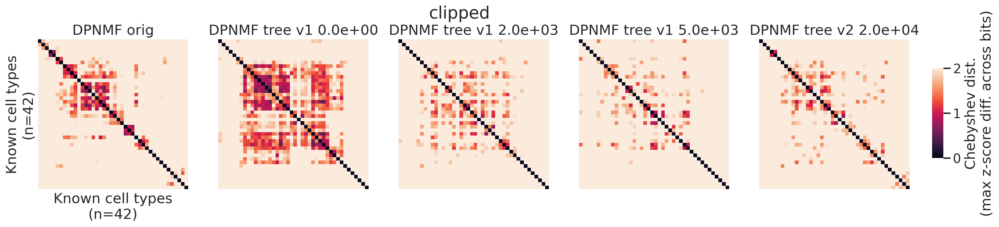

In [30]:
n = len(methods)
nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(nx*4,ny*4))
cbar_ax = fig.add_axes([0.92, 0.3, 0.01, 0.4])
fig.suptitle('clipped')
for i, meth in enumerate(methods):
    ax = axs.flat[i]
    if i == 0: 
        label = True
    else: 
        label = False
        
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res_g[meth] 
    dists_cheb = pairwise_distances(embx_clsts_z, metric='chebyshev') # max across bits (Linf norm)
    distmat = dists_cheb[_rows_l3clsts,:][:,_rows_l3clsts]
    
    designu.plot_heatcorr(
        # embx_clsts_corr, 
        # embx_clsts_corr[_rows_l3clsts,:][:,_rows_l3clsts], 
        distmat,
        vmin=0, 
        vmax=2,
        title=meth, 
        ax=ax,
        cbar_ax=cbar_ax,
        label=label,
        cmap='rocket',
        metric_label='Chebyshev dist.\n(max z-score diff. across bits)')

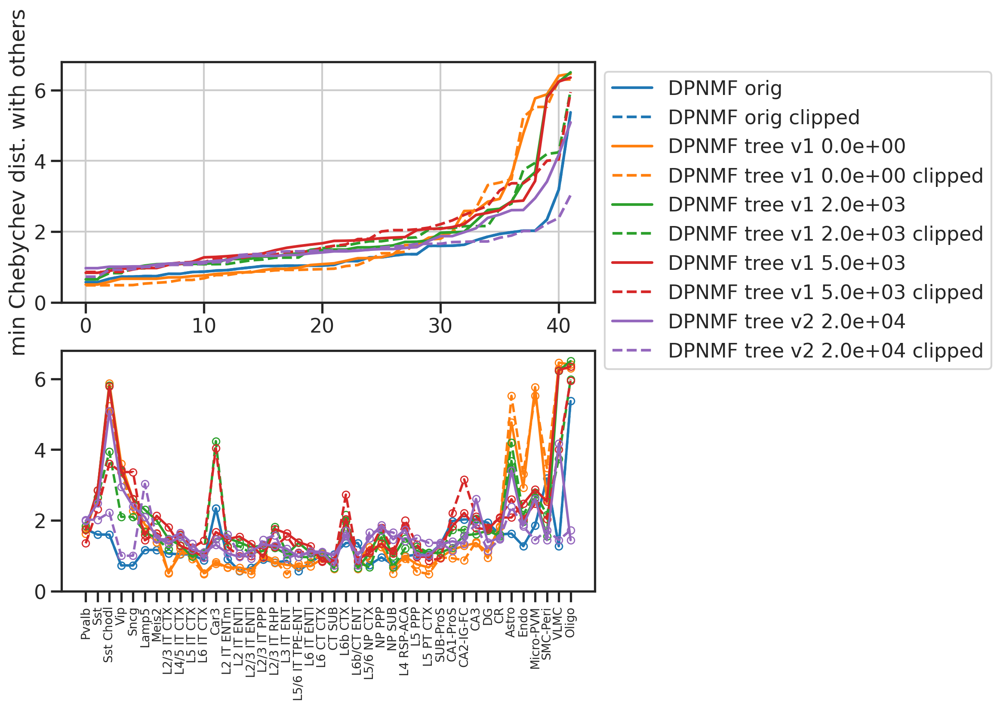

In [31]:
fig, axs = plt.subplots(2,1,figsize=(1*8,2*4))
for i, meth in enumerate(methods):
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res[meth] 
    dists_cheb = pairwise_distances(embx_clsts_z, metric='chebyshev') # max across bits (Linf norm)
    distmat = dists_cheb[_rows_l3clsts,:][:,_rows_l3clsts]
    
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z_g, embx_clsts_corr, _rows, _cols, _dcols = all_res_g[meth] 
    dists_cheb = pairwise_distances(embx_clsts_z_g, metric='chebyshev') # max across bits (Linf norm)
    distmat_g = dists_cheb[_rows_l3clsts,:][:,_rows_l3clsts]
    
    # corr mat
    ax = axs[0]
    ax.plot(np.sort(np.sort(distmat, axis=0)[1]),   '-',  label=meth, color=colors[i])
    ax.plot(np.sort(np.sort(distmat_g, axis=0)[1]), '--', label=meth+" clipped", color=colors[i])
    
    ax = axs[1]
    ax.plot(np.sort(distmat, axis=0)[1],   '-o',  label=meth, markersize=6, linewidth=2, fillstyle='none', color=colors[i])
    ax.plot(np.sort(distmat_g, axis=0)[1], '--o', label=meth+" clipped", markersize=6, linewidth=2, fillstyle='none', color=colors[i])
    ax.set_xticks(np.arange(len(distmat)))
    ax.set_xticklabels(l3clst_order, rotation=90, fontsize=10)
    ax.grid(False)
    
axs[0].set_ylim(ymin=0)
axs[1].set_ylim(ymin=0)
axs[0].legend(bbox_to_anchor=(1,1))
axs[0].set_ylabel('min Chebychev dist. with others')
# axs[1].set_ylabel('min Chebychev dist. with others')
plt.show()

# variance explained before and after

In [93]:
def calc_err(x, w, rhos=None):
    """
    X: (p, n)
    w: (p, k)
    """
    xhat = w.dot(w.T.dot(x))
    if rhos is None:
        return np.linalg.norm(x-xhat, ord='fro')**2
    else:
        return [np.linalg.norm(x-rho*xhat, ord='fro')**2 for rho in rhos]

def calc_ss(x):
    """
    X: (p, n)
    """
    xmean = np.mean(x, axis=1)
    xcentered = x-xmean.reshape(-1,1)
    return (np.linalg.norm(xcentered, ord='fro')**2)

def calc_r2(x, w):
    """
    X: (p, n)
    w: (p, k)
    """
    return 1 - calc_err(x, w)/calc_ss(x)

In [36]:
list(all_pmats.keys())

['DPNMF orig',
 'DPNMF tree v1 0.0e+00',
 'DPNMF tree v1 2.0e+03',
 'DPNMF tree v1 5.0e+03',
 'DPNMF tree v2 2.0e+04']

In [46]:
ftrs = basicu.libsize_norm(ftrs_all, scale=1e6)
ftrs.shape

torch.Size([5000, 45768])

In [68]:
w0     = all_ws['DPNMF tree v1 0.0e+00']
gidx_w0 = basicu.get_index_from_array(genes_data, newgenes)

pmat   = all_pmats['DPNMF tree v1 0.0e+00']
gidx   = all_gidxs['DPNMF tree v1 0.0e+00']
pmat_g = all_pmats_g['DPNMF tree v1 0.0e+00']
gidx_g = all_gidxs_g['DPNMF tree v1 0.0e+00']

w0.shape, gidx_w0.shape, pmat.shape, gidx.shape, pmat_g.shape, gidx_g.shape, 

((13489, 24), (13489,), (10465, 24), (10465,), (10360, 24), (10360,))

In [105]:
w = w0
print(np.linalg.norm(w, 2))
_X = ftrs[:,gidx_w0].T.numpy()
calc_r2(_X, w)

1.0


0.7103150876013253

In [106]:
rhos = [0.8, 0.9, 1, 1.1, 1.2, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2,]
testvals = 1 - calc_err(_X, w, rhos=rhos)/calc_ss(_X)

Text(0, 0.5, 'explained variance ratio')

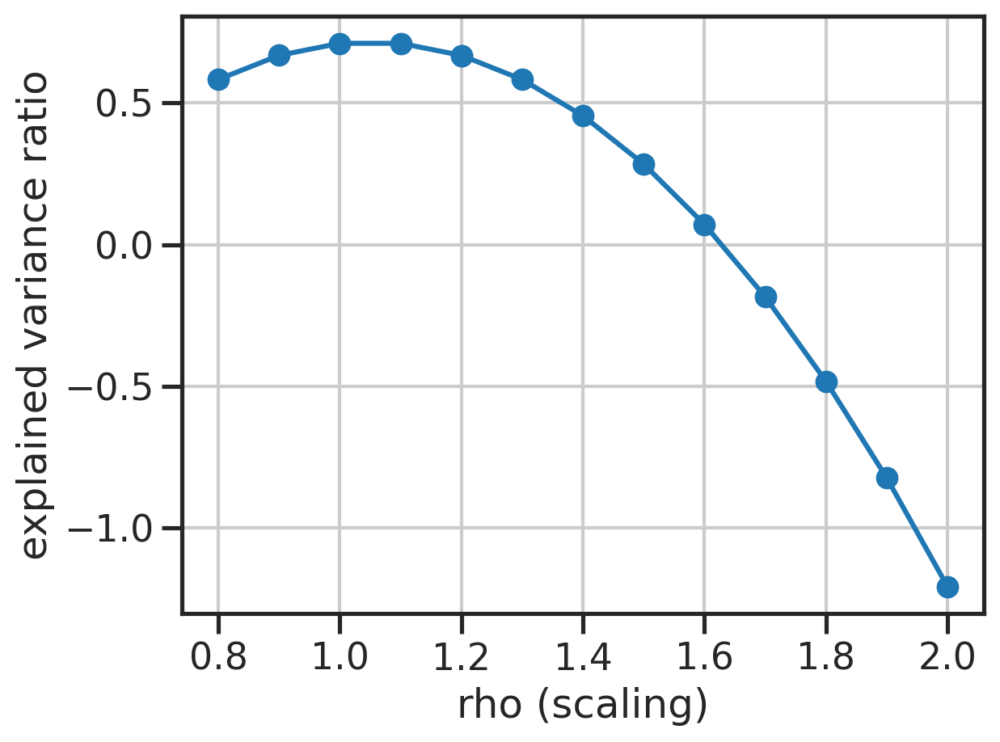

In [107]:
plt.plot(rhos, testvals, '-o')
plt.xlabel('rho (scaling)')
plt.ylabel('explained variance ratio')

In [108]:
w = pmat.values/np.linalg.norm(pmat.values, 2)
print(np.linalg.norm(w, 2))
_X = ftrs[:,gidx].T.numpy()
calc_r2(_X, w)

0.9999999999999994


0.7105817729186272

In [109]:
rhos = [0.8, 0.9, 1, 1.1, 1.2, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2,]
testvals = 1 - calc_err(_X, w, rhos=rhos)/calc_ss(_X)

Text(0, 0.5, 'explained variance ratio')

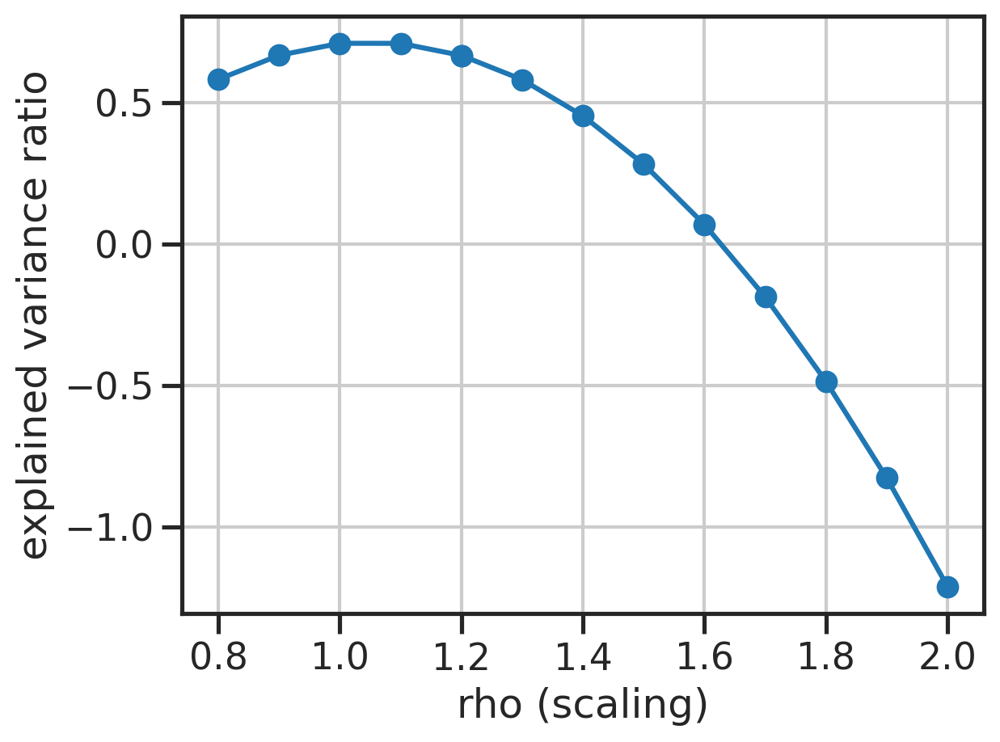

In [110]:
plt.plot(rhos, testvals, '-o')
plt.xlabel('rho (scaling)')
plt.ylabel('explained variance ratio')

In [111]:
w = pmat_g.values/np.linalg.norm(pmat_g.values, 2)
print(np.linalg.norm(w, 2))
_X = ftrs[:,gidx_g].T.numpy()
calc_r2(_X, w)

1.0


-0.975140300379147

In [112]:
rhos = [0.8, 0.9, 1, 1.1, 1.2, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2,]
testvals = 1 - calc_err(_X, w, rhos=rhos)/calc_ss(_X)

Text(0, 0.5, 'explained variance ratio')

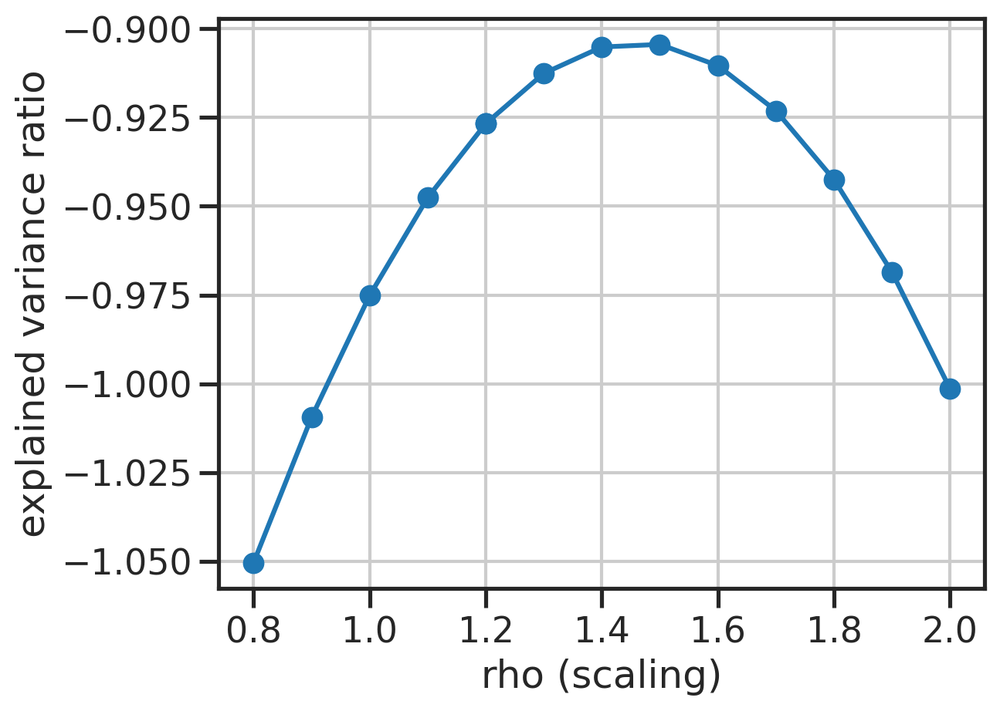

In [113]:
plt.plot(rhos, testvals, '-o')
plt.xlabel('rho (scaling)')
plt.ylabel('explained variance ratio')

# optimize clipping?
- minimize the number of probes clipped


In [223]:
from scipy import optimize

In [224]:
def cost(rho, wgsum, gc):
    """
    """
    return np.sum(np.maximum(0, rho/wsum*wgsum-gc)) 

def cost2(rho, wgsum, gc):
    """
    """
    return np.linalg.norm((rho*wgsum-gc), 2) 

def cost3(rho_bits, w, gc):
    """
    """
    return np.linalg.norm((w.dot(rho_bits)-gc), 2) 

def cost4(rho_bits, w, gc):
    """
    """
    return np.sum(np.maximum((w.dot(rho_bits)-gc), 0))

def reg_cost(rho, wgsum, gc, lmd):
    return cost(rho, wgsum, gc) - lmd*rho

def reg_cost4(rho_bits, w, gc, lmd):
    return cost4(rho_bits, w, gc) - lmd*np.sum(rho_bits)

In [305]:
def cost5(beta, X, y, lmd):
    """
    """
    diff = X.dot(beta)-y # 
    term1 = np.linalg.norm(np.maximum( diff,0), 2)**2 # penalty on diff > 0
    term2 = np.linalg.norm(np.maximum(-diff,0), 2)**2 # penalty on diff < 0
    return term1 + lmd*term2

def cost6(beta, X, y):
    """
    """
    diff = X.dot(beta)-y # 
    term1 = np.linalg.norm(diff, 2)**2 # penalty on diff > 0
    return term1

In [254]:
# cost5(np.repeat(1e5,24), w/np.sum(w), gc, 0.01)

(13489,)


2252.2923913319655

In [230]:
w = w0.values

wgsum = w.sum(axis=1)
wsum = w.sum()
unit_wgsum = wgsum/wsum
gc = newgene_cnstrnts # .shape
wsum, wgsum.shape, gc.shape

(181.26767856887145, (13489,), (13489,))

In [225]:
optimize.minimize(reg_cost, 1e4, args=(wgsum/np.sum(wgsum), gc, 1), tol=1e-3)

      fun: -7.978445584272125e+22
 hess_inv: array([[-5.36950239e+30]])
      jac: array([-0.99448331])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 1568
      nit: 7
     njev: 778
   status: 2
  success: False
        x: array([8.02270446e+22])

In [226]:
optimize.minimize(cost2, 1e2, args=(wgsum/np.sum(wgsum), gc))

      fun: 8978.766209315232
 hess_inv: array([[12754607.89473685]])
      jac: array([0.])
  message: 'Optimization terminated successfully.'
     nfev: 32
      nit: 3
     njev: 16
   status: 0
  success: True
        x: array([72184.28585533])

In [227]:
res3 = optimize.minimize(cost3, np.repeat(5e4,24), args=(w/np.sum(w), gc))
res3.success, res3.x

(False,
 array([332729.95715898,  82766.93294023,  39599.5077336 ,   6638.43812652,
         39793.64429404,  39599.5077336 ,  82766.9317453 ,  82961.06950067,
        169684.19606049,  83155.20899068,  82766.9315523 ,   6638.43831952,
         82961.07108427,  49999.99989359,  49805.86357078, 299574.74921486,
        299574.75498474,  82961.07084664,  39599.5077336 ,  39599.50788464,
        126322.63275445, 126516.76942129,  39599.50907957,  82961.06965171]))

In [228]:
res4 = optimize.minimize(cost4, np.repeat(5e4,24), args=(w/np.sum(w), gc))
res4.success, res4.x

(True,
 array([ -19482.69543842,  -36853.39708168,  -15140.08007085,
          -4283.4231562 ,  -56395.35072797,  -10797.4081762 ,
        -221416.56560245, -129134.98410297,  -86793.9778408 ,
         -40110.36202708,   -7540.35660094,   -8626.07743958,
         -20568.40951704,   -4283.41412813,  -56395.33133591,
         -48795.651625  ,  -86793.97929306,  -50967.00170313,
         -29253.73002616,   -3197.754338  ,  -42281.68819312,
        -195360.6045075 ,   -4283.40546797,  -90050.99381789]))

In [255]:
res5 = optimize.minimize(reg_cost4, np.repeat(5e4,24), args=(w/np.sum(w), gc, 1e-2))
res5.success, res5.x

(False,
 array([ 57303.0141145 ,  69027.27245125, 109917.71632751, 104647.39878879,
         38247.48344911, 127187.15602975,  -7700.64410456,  -2487.91057638,
         25159.8484803 ,  58689.43185581, 116854.74869681, 147573.92031965,
         50847.63227211, 112292.28683131,  13700.74266432,  74073.00428167,
         20765.46643478,  48089.73233631,  89057.87005793, 117116.49483767,
         37465.40956178, -11846.50794733, 121954.12035321,   4174.24698843]))

In [277]:
np.repeat(5e5,24)

array([500000., 500000., 500000., 500000., 500000., 500000., 500000.,
       500000., 500000., 500000., 500000., 500000., 500000., 500000.,
       500000., 500000., 500000., 500000., 500000., 500000., 500000.,
       500000., 500000., 500000.])

In [318]:
res6 = optimize.minimize(cost5, np.repeat(1e4,24), args=(w/np.sum(w), gc, 1), bounds=[(0, None)]*24)
res6.success, res6.x, np.sum(np.dot(w/np.sum(w), res6.x))

(True,
 array([297963.47956481,  47631.79053203,   8095.74116855,   3556.20917169,
         20061.65037592,  14634.8456451 ,   4029.23277622,  14386.55686673,
        125772.65852983,  86503.22388315,      0.        ,   7499.53248047,
         42370.58533727,   6886.34348976,   8679.44277472, 343372.27524493,
        799863.13464451,  23826.10053161,  27411.30706673,  25622.32203255,
         84299.49260755, 108587.02036722,  35999.14906287,  11171.93057828]),
 192198.16411292876)

In [325]:
res6 = optimize.minimize(cost5, np.repeat(1e4,24), args=(w/np.sum(w), gc, 0.3), bounds=[(0, None)]*24)
res6.success, res6.x, np.sum(np.dot(w/np.sum(w), res6.x))

(True,
 array([1.55550812e+05, 1.41864370e+04, 3.48041975e+03, 0.00000000e+00,
        3.08011739e+03, 6.20884803e+03, 0.00000000e+00, 4.20718326e+03,
        6.22439649e+04, 2.78584196e+04, 0.00000000e+00, 2.82861366e+02,
        1.74234712e+04, 1.20261994e+03, 2.07615935e+04, 1.60950309e+05,
        3.94919981e+05, 2.41536378e+04, 4.17577020e+03, 0.00000000e+00,
        3.76337470e+04, 1.20427837e+04, 1.56384166e+04, 7.74251203e+03]),
 88350.31015659643)

In [317]:
res7 = optimize.minimize(cost6, np.repeat(1e4,24), args=(w/np.sum(w), gc), bounds=[(0, None)]*24)
res7.success, res7.x, np.sum(np.dot(w/np.sum(w), res7.x))

(True,
 array([311264.38358115,  51298.50605607,      0.        ,  32026.53426144,
         25690.89419861,  18816.95742036,      0.        ,  25625.15737893,
        130179.87568349,  98762.09914235,      0.        ,  29788.71547712,
         57519.18166107,  20452.89752274,   1052.51415016, 346874.79552251,
        768101.5889493 ,  64466.38465652,  18265.83002408,  18597.70000313,
         83273.00265798,  15840.99634855,  40106.12046402,  24498.67242968]),
 182645.5898015921)

In [231]:
tps = [1e2, 1e3, 1e4, 1e5]
brcs = [np.sum(np.maximum(0, tp/wsum*wgsum-gc)) for tp in tps]

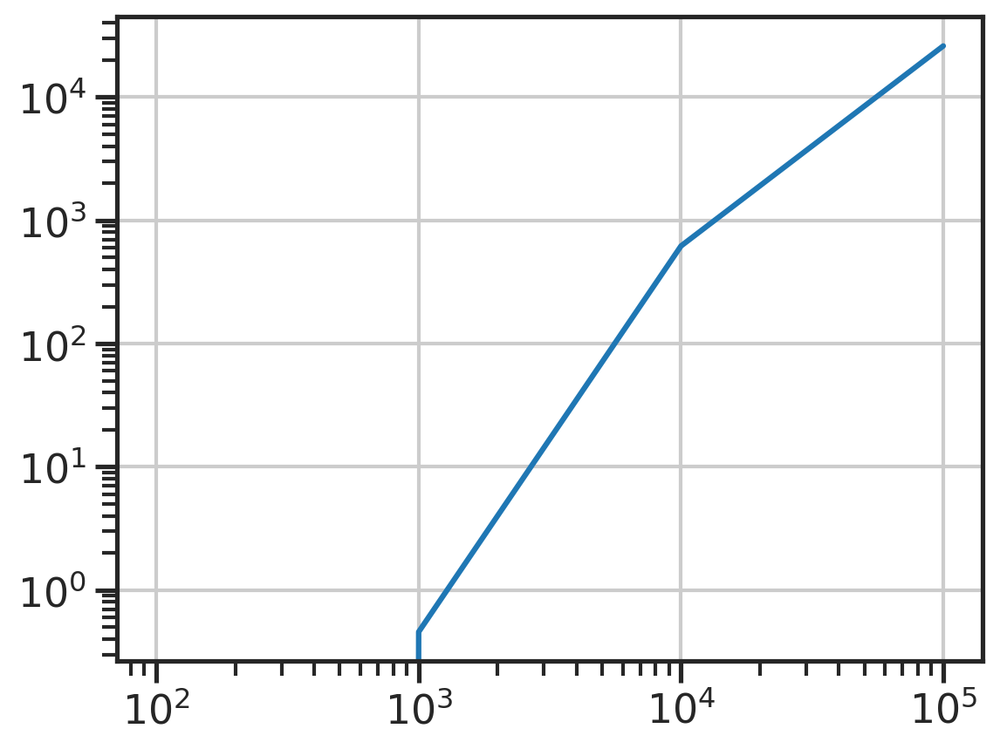

In [232]:
plt.plot(tps, brcs)
plt.xscale('log')
plt.yscale('log')

In [233]:
tps = [1e4, 5e4, 72184.28585533, 8e4, 1e5, 2e5]
cost2s = [cost2(tp, wgsum/np.sum(wgsum), gc) for tp in tps]
cost3s = [cost3(np.repeat(tp, 24), w/np.sum(w), gc) for tp in tps]

In [264]:
ws = (w/np.sum(w)).dot(res6.x)
ws.sum()

2301.240230504963

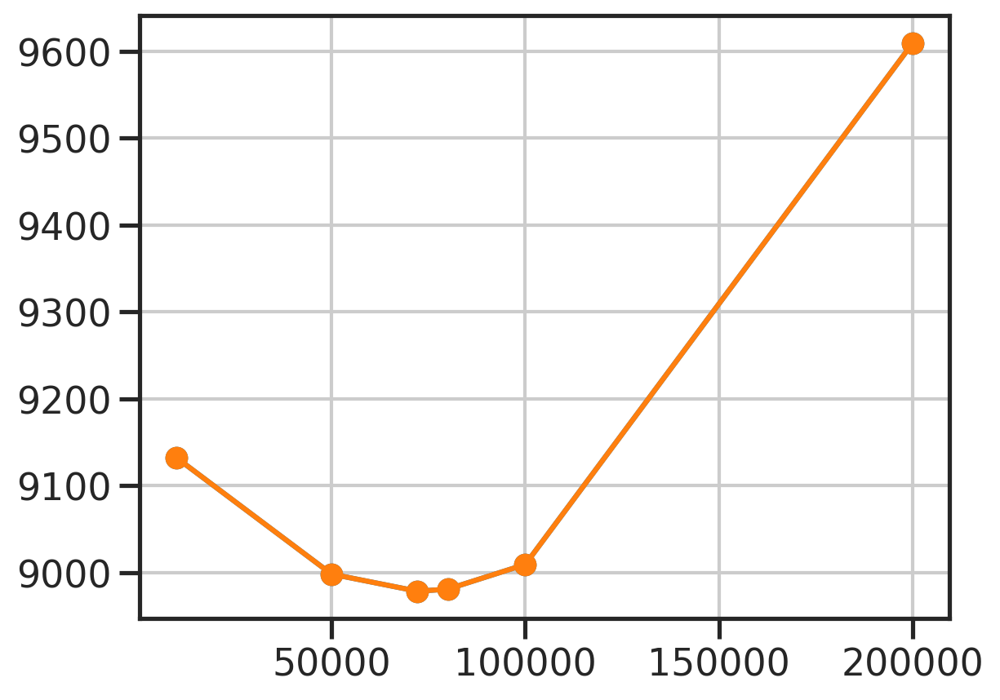

In [234]:
plt.plot(tps, cost2s, '-o')
plt.plot(tps, cost3s, '-o')

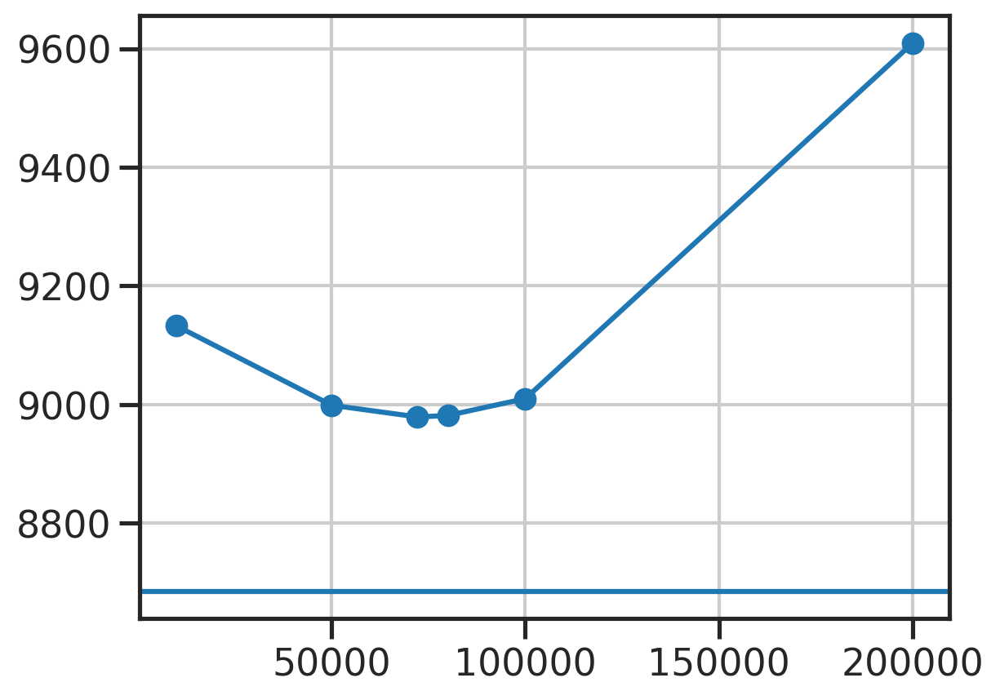

In [235]:
plt.plot(tps, cost3s, '-o')
plt.axhline(cost3(res3.x, w/np.sum(w), gc))

In [301]:

betas = [np.repeat(num, 24) for num in [1e2, 1e3, 1e4, 2e4, 5e4, 1e5, 2e5]]
cost5s = [cost5(beta, w/np.sum(w), gc, 1) for beta in betas]
cost6s = [cost6(beta, w/np.sum(w), gc,) for beta in betas]

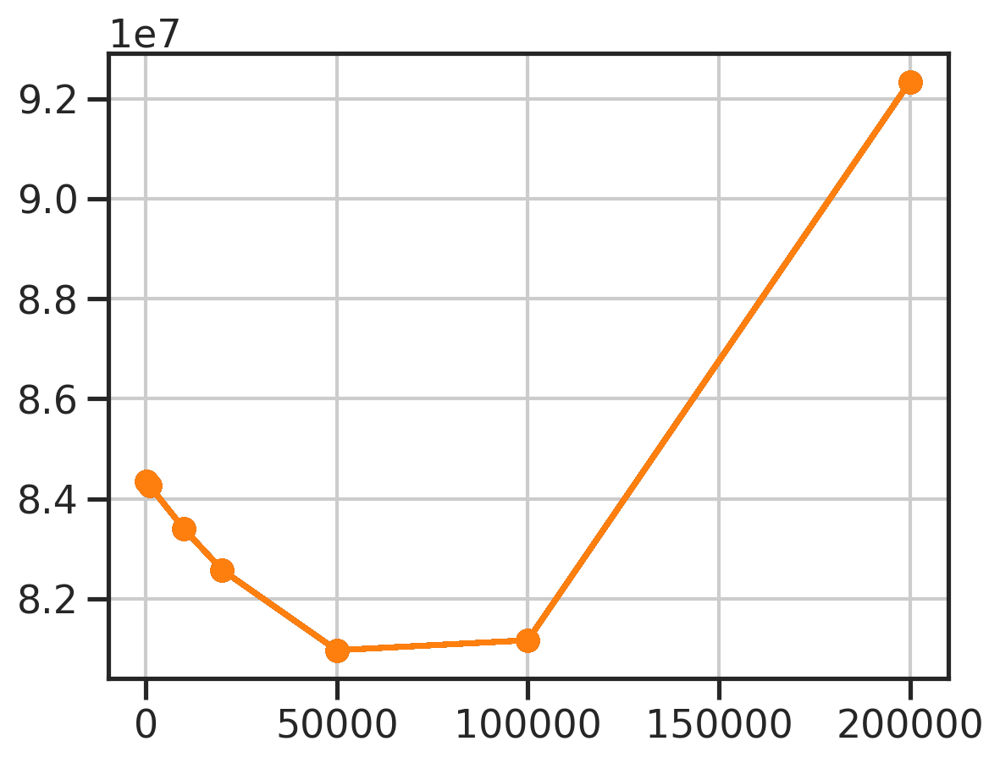

In [302]:
fig, ax = plt.subplots()
ax.plot(betas, cost5s, '-o', color='C0')
ax.plot(betas, cost6s, '-o', color='C1')
plt.show()

In [314]:
cost5(res6.x, w/np.sum(w), gc, 1), cost5(res7.x, w/np.sum(w), gc, 1)

(72815979.74096031, 72820635.14162198)

In [315]:
cost6(res6.x, w/np.sum(w), gc), cost6(res7.x, w/np.sum(w), gc)

(72815979.74096033, 72820635.14162195)

In [316]:
wscaled = np.dot(w/np.sum(w), res6.x)
np.sum(wscaled)

192198.16411292876